# PAO-EquiML

In [1]:
import logging
import warnings
import torch
import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import colormaps
from torch_cluster import radius_graph
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
from torch_scatter import scatter
from torch.utils.data import Dataset

from e3nn import o3
from e3nn.nn import FullyConnectedNet, Gate, models
from e3nn.o3 import FullyConnectedTensorProduct
from e3nn.math import soft_one_hot_linspace
from e3nn.util.test import assert_equivariant
from e3nn.nn.models.gate_points_2101 import Network

from pathlib import Path
from pao_file_utils import parse_pao_file, append_samples, write_pao_file, read_cp2k_energy

from sklearn.model_selection import train_test_split

t = torch.tensor

In [2]:
change_of_coord = t([
    # this specifies the change of basis yzx -> xyz
    [0., 0., 1.],
    [1., 0., 0.],
    [0., 1., 0.]
])
prim_basis_specs = {
    "O": "2x0e + 2x1o + 1x2e", # DZVP-MOLOPT-GTH for Oxygen: two s-shells, two p-shells, one d-shell
    "H": "2x0e + 1x1o" # DZVP-MOLOPT-GTH for Hydrogen: two s-shells, one p-shell
}
pao_basis_size = 4

In [3]:
class PAO_Object:
    def __init__(self, kind, atomkind, coords, xblock):
        self.kind = kind
        self.atomkind = atomkind
        self.coords = coords
        self.xblock = xblock
        U, S, Vh = torch.linalg.svd(xblock, full_matrices=False)
        self.label = Vh
        
    def swap(self, idx, jdx):
        idxs = list(range(len(self.coords)))
        idxs[idx], idxs[jdx] = idxs[jdx], idxs[idx]
        coords_swap = self.coords.clone().detach()
        atomkind_swap = self.atomkind.copy()
        index = torch.LongTensor(idxs)
        coords_swap[index] = self.coords
        atomkind_swap[idx], atomkind_swap[jdx] = atomkind_swap[jdx], atomkind_swap[idx]
        self.coords = coords_swap
        self.atomkind = atomkind_swap

class PAO_dataset(Dataset):
    def __init__(self, pao_objects):
        self.labels = [pao_object.label for pao_object in pao_objects]
        self.atomkinds = [generate_f_in(pao_object) for pao_object in pao_objects]
        self.coords = [pao_object.coords for pao_object in pao_objects]

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        coords = self.coords[idx]
        label = self.labels[idx]
        atomkind = self.atomkinds[idx]
        return coords, atomkind, label

# Torch Module for PAO learning
class PAO_model(torch.nn.Module):
    def __init__(self, max_radius, num_layers, num_neighbours, pao_basis_size, prim_basis_spec, prim_basis_size, irreps_input, irreps_sh, irreps_output):
        super(PAO_model, self).__init__()
        change_of_coord = t([
            [0., 0., 1.],
            [1., 0., 0.],
            [0., 1., 0.]
        ]) 
        self.dim = prim_basis_size
        self.max_radius = max_radius
        self.num_distances = 10
        self.num_neighbours = num_neighbours
        self.pao_basis_size = pao_basis_size
        self.prim_basis_spec = prim_basis_spec
        self.prim_basis_size = prim_basis_size
        self.irreps_sh = irreps_sh
        self.irreps_output = irreps_output
        
        irreps_mid = o3.Irreps([(5, (l, (-1)**l)) for l in range(prim_basis_spec.lmax+1)])
        self.irreps_mid = irreps_mid
        
        #self.lin1 = o3.Linear(irreps_sh, irreps_sh)
        self.tp =  o3.FullyConnectedTensorProduct(irreps_input, irreps_sh, irreps_mid, shared_weights=False)
        #self.lin2 = o3.Linear(irreps_mid, irreps_mid)
        self.tp_out = o3.FullyConnectedTensorProduct(irreps_mid, irreps_mid, irreps_output, shared_weights=True)
        
        self.num_layers = num_layers
        self.fc = FullyConnectedNet([self.num_distances, num_layers, self.tp.weight_numel], torch.nn.functional.silu)
        self.coord_change = self.tp_out.irreps_out.D_from_matrix(change_of_coord)

        idx_in = []
        aux_H_idx_in = 2*t(prim_basis_spec.ls)+1 
        self.wigner_dict = {}

        for idx, mu_i in enumerate(prim_basis_spec.ls):
            # Spherical Harmonic Factor 2
            for jdx, mu_j in enumerate(prim_basis_spec.ls[idx:]):
                # Contraction contribution of Spherical Harmonic with L={|L1-L2|...L1+L2}
                for mu_ij in range(abs(mu_i-mu_j),mu_i+mu_j+1):
                    # Check parity (even*even=even, odd*odd=even, even*odd=odd) and generate wigner matrix only for match
                    if mu_i%2==mu_j%2 and mu_ij%2==0 or mu_i%2!=mu_j%2 and mu_ij%2==1:
                        idx_in.append(2*mu_ij+1)
                        wigner_m = o3.wigner_3j(mu_i, mu_j, mu_ij)
                        wig_zero_factor = wigner_m[(2*mu_i+1)//2,(2*mu_j+1)//2,(2*mu_ij+1)//2]
                        wigner_m = wig_zero_factor*wigner_m
                        self.wigner_dict[f"{mu_i}{mu_j}{mu_ij}"] = wigner_m.clone()

        idx_in = t(idx_in)
        self.idx_out = torch.cumsum(idx_in, dim=0, dtype=int)              # rh-index into pred-vector
        self.aux_H_idx_out = torch.cumsum(aux_H_idx_in, dim=0, dtype=int)    # rh-index into auxiliary Hamiltonian
        self.idx_in = self.idx_out-idx_in                                    # lh-index of pred-vector
        self.aux_H_idx_in = self.aux_H_idx_out-aux_H_idx_in                  # lh-index into auxiliary Hamiltonian


    def build_aux_H(self, pred):
        aux_H = torch.zeros((self.prim_basis_spec.dim,self.prim_basis_spec.dim))        # auxiliary Hamiltonian
        jdx_shift = 0

        # Spherical Harmonic Factor 1
        for idx, mu_i in enumerate(self.prim_basis_spec.ls):
            # Spherical Harmonic Factor 2
            for jdx, mu_j in enumerate(self.prim_basis_spec.ls[idx:]):
                # Contraction contribution of Spherical Harmonic with L={|L1-L2|...L1+L2}
                for mu_ij in range(abs(mu_i-mu_j),mu_i+mu_j+1):
                    # Check parity (even*even=even, odd*odd=even, even*odd=odd) and calculate coefficients only for match
                    if mu_i%2==mu_j%2 and mu_ij%2==0 or mu_i%2!=mu_j%2 and mu_ij%2==1:
                        # Contraction per shell
                        contraction_coefficients = torch.matmul(self.wigner_dict[f"{mu_i}{mu_j}{mu_ij}"], pred[self.idx_in[jdx_shift]:self.idx_out[jdx_shift]])
                        # Add shell contribution to resp. block in the auxiliary Hamiltionan
                        aux_H[self.aux_H_idx_in[idx]:self.aux_H_idx_out[idx],self.aux_H_idx_in[jdx+idx]:self.aux_H_idx_out[jdx+idx]] = \
                        aux_H[self.aux_H_idx_in[idx]:self.aux_H_idx_out[idx],self.aux_H_idx_in[jdx+idx]:self.aux_H_idx_out[jdx+idx]]   \
                        + contraction_coefficients 
                        if idx!=idx+jdx: # also add transform of non-diagonal blocks
                            aux_H[self.aux_H_idx_in[jdx+idx]:self.aux_H_idx_out[jdx+idx],self.aux_H_idx_in[idx]:self.aux_H_idx_out[idx]]\
                            = aux_H[self.aux_H_idx_in[jdx+idx]:self.aux_H_idx_out[jdx+idx],self.aux_H_idx_in[idx]:self.aux_H_idx_out[idx]]\
                            + contraction_coefficients.T 
                        jdx_shift += 1
        return aux_H

    def build_aux_H_batch(self, batch, pred):
        aux_H = torch.zeros((batch, self.prim_basis_spec.dim,self.prim_basis_spec.dim))        # auxiliary Hamiltonian
        jdx_shift = 0

        # Spherical Harmonic Factor 1
        for idx, mu_i in enumerate(self.prim_basis_spec.ls):
            # Spherical Harmonic Factor 2
            for jdx, mu_j in enumerate(self.prim_basis_spec.ls[idx:]):
                # Contraction contribution of Spherical Harmonic with L={|L1-L2|...L1+L2}
                for mu_ij in range(abs(mu_i-mu_j),mu_i+mu_j+1):
                    # Check parity (even*even=even, odd*odd=even, even*odd=odd) and calculate coefficients only for match
                    if mu_i%2==mu_j%2 and mu_ij%2==0 or mu_i%2!=mu_j%2 and mu_ij%2==1:
                        # Contraction per shell
                        wigner_m = self.wigner_dict[f"{mu_i}{mu_j}{mu_ij}"]
                        pred_block = pred[:,self.idx_in[jdx_shift]:self.idx_out[jdx_shift]]

                        # If possible, convert this to torch.einsum() notation
                        contraction_coefficients = \
                            torch.transpose(
                                torch.transpose(
                                torch.matmul(wigner_m, torch.transpose(pred_block, dim0=0, dim1=1)),
                                dim0=0, dim1=2),
                            dim0=1, dim1=2)                        
                    
                        # Add shell contribution to resp. block in the auxiliary Hamiltionan
                        aux_H[:,self.aux_H_idx_in[idx]:self.aux_H_idx_out[idx],self.aux_H_idx_in[jdx+idx]:self.aux_H_idx_out[jdx+idx]] = \
                        aux_H[:,self.aux_H_idx_in[idx]:self.aux_H_idx_out[idx],self.aux_H_idx_in[jdx+idx]:self.aux_H_idx_out[jdx+idx]]   \
                        + contraction_coefficients 
                        if idx!=idx+jdx: # also add transform of non-diagonal blocks
                            aux_H[:,self.aux_H_idx_in[jdx+idx]:self.aux_H_idx_out[jdx+idx],self.aux_H_idx_in[idx]:self.aux_H_idx_out[idx]]\
                            = aux_H[:,self.aux_H_idx_in[jdx+idx]:self.aux_H_idx_out[jdx+idx],self.aux_H_idx_in[idx]:self.aux_H_idx_out[idx]]\
                            + torch.transpose(contraction_coefficients, dim0=1, dim1=2) 
                        jdx_shift += 1
        return aux_H

    def forward(self, data):
        batch_size = len(data.batch.unique())
        edge_vec = data.pos
        f_in = data.z
        x = o3.spherical_harmonics(self.irreps_sh, edge_vec, normalize=True, normalization='component')
        emb = soft_one_hot_linspace(x=edge_vec.norm(dim=1), start=0.0, end=self.max_radius, number=self.num_distances, 
                                    basis='smooth_finite', cutoff=True).mul(self.num_distances**0.5)
        #x = self.lin1(sh)
        aux_H = self.tp(f_in, x, self.fc(emb))
        aux_H = aux_H.reshape((batch_size,aux_H.shape[0]//batch_size,aux_H.shape[1])).sum(dim=1).div(self.num_neighbours**0.5)
        #aux_H = self.lin2(aux_H)
        aux_H = self.tp_out(aux_H, aux_H)
        aux_H = torch.matmul(aux_H, self.coord_change)
        pao_vectors = self.build_aux_H_batch(batch_size, aux_H)
        return pao_vectors

In [4]:
def parse_pao_file_torch(path: Path):
    kinds, atom2kind, coords, xblocks = parse_pao_file(path)
    return kinds, atom2kind, t(coords, dtype=torch.float32), [t(x, dtype=torch.float32) for x in xblocks]
    
def atom_number(atomkind):
    f_in = t([[1] if k=="H" else [8] for k in atomkind], dtype=torch.float32)
    return f_in

def generate_f_in(atomkind):  
    f_in = t([(k=="H", k=="O") for k in atomkind], dtype=torch.float32)
    return f_in

# Remove central atom and create PAO object from PAO file
def generate_pao_object_from_file(file_path):
    pao_objects = []
    kinds, atom2kind, coords, xblocks = parse_pao_file_torch(file_path)

    for idx, atom in enumerate(atom2kind):
        rel_coords = coords - coords[idx]
        idxs = list(range(len(atom2kind)))
        idxs.pop(idx)
        atomkind = [atom2kind[atom] for atom in idxs]
#        f_in = atom_number(atomkind)
#        f_in = f_in/f_in.norm(dim=0)
        f_in = generate_f_in([atom2kind[atom] for atom in idxs])
        pao_objects.append(PAO_Object(kinds[atom], f_in, rel_coords[idxs], xblocks[idx]))
    return pao_objects

# Irreps associated with the auxiliary Hamiltonian
def generate_irreps_output(prim_basis_specs):
    all_ir = o3.Irreps()
    for idx, l1 in enumerate(prim_basis_spec.ls):
        irrep1=o3.Irrep(l1, (-1)**l1)
        for l2 in prim_basis_spec.ls[idx:]:
            irrep2=o3.Irrep(l2, (-1)**l2)
            mul = irrep1*irrep2
            for ir in mul:
                if ir.l%2==0 and ir.p==1 or ir.l%2==1 and ir.p==-1:
                    all_ir += ir
    return all_ir.simplify()

In [5]:
# Eigendecomposition of auxiliary hamiltonian to extract PAO basis vectors from eigenvectors
def aux_H_to_pao(aux_H, pao_basis_size):
    L, Q = torch.linalg.eigh(aux_H)
    pao_vectors = torch.transpose(Q[:,:,:pao_basis_size], dim0=1, dim1=2)
    return pao_vectors

### Read PAO files for dataset generation

In [6]:
pao_objects = []
#pao_objects.extend(generate_pao_object_from_file(Path(f"2H2O_rotations/rand_10/2H2O_pao44-1_0.pao")))
for i in range(0,2001,25):
    pao_objects.extend(generate_pao_object_from_file(Path(f"2H2O_MD/frame_{i:04d}/2H2O_pao44-1_0.pao")))

pao_objects_O = [pao_object for pao_object in pao_objects if pao_object.kind.atomic_number==8]
pao_objects_H = [pao_object for pao_object in pao_objects if pao_object.kind.atomic_number==1]
kinds, atom2kind, coords, _ = parse_pao_file_torch(Path("2H2O_MD/frame_0000/2H2O_pao44-1_0.pao"))

In [7]:
# Loss functions.

def loss_function_ortho_projector_batch(pred, label):
    pred_projector = torch.bmm(torch.transpose(pred, dim0=1, dim1=2), pred)
    label_projector = torch.bmm(torch.transpose(label, dim0=1, dim1=2), label)
    residual = pred_projector - label_projector
    return residual.pow(2).mean()

def loss_function_ortho_projector(pred, label):
    pred_projector = pred.T @ pred
    label_projector = label.T @ label
    proj_residual = pred_projector - label_projector
    return proj_residual.pow(2).mean()


## PAO-Model Oxygen

In [8]:
# Irreps Input
irreps_input = o3.Irreps("2x0e") # features: is_hydrogen, is_oxygen

# Irreps Spherical Harmonics
irreps_sh = o3.Irreps.spherical_harmonics(lmax=2)

# Primitive Basis specs

prim_basis_spec = o3.Irreps(prim_basis_specs["O"])
prim_basis_size = o3.Irreps(prim_basis_spec).dim

# Irreps Output
# ss ss'  sp  sp'  sd
#    s's' s'p s'p' s'd
#         pp  pp'  pd
#             p'p' p'd
#                  dd
# The required spherical harmonics could also be evaluated via o3.ReducedTensorProduct as part of the model based on prim_basis_spec.
# Two issues: 1. ReducedTensorProduct returns spherical harmonics ordered according to angular momentum, 
# e.g. "7x0e + 6x1o + 6x2e + 2x3o + 1x4e" for Oxygen with prim_basis_spec "2x0e + 2x1o + 1x2e"
# 2. ReducedTensorProduct also includes coefficients for "pseudo" harmonics such as "1e" and "2o" which are not necessary to build
# the auxiliary Hamiltonian.
irreps_output = generate_irreps_output(prim_basis_spec)
print(irreps_output)

2x0e+2x1o+1x2e+1x0e+2x1o+1x2e+1x0e+1x2e+1x0e+1x2e+1x1o+1x3o+1x0e+1x2e+1x1o+1x3o+1x0e+1x2e+1x4e


In [9]:
batch_size = 32
data_O = []

for pao_object in pao_objects_O:
    data_O += [
        Data(
            x=None, pos=pao_object.coords, y=pao_object.label, z=pao_object.atomkind
        )
    ]

train_data_O, test_data_O = train_test_split(data_O, test_size=0.2)
train_loader_O = DataLoader(
    train_data_O, batch_size=batch_size, shuffle=True
)

In [10]:
max_radius = 4.0
num_neighbours = 5
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=UserWarning)
    model_O = PAO_model(
        max_radius=max_radius,
        num_layers=32,
        num_neighbours=num_neighbours,
        pao_basis_size=pao_basis_size,
        prim_basis_spec=prim_basis_spec,
        prim_basis_size=prim_basis_size, 
        irreps_input=irreps_input,
        irreps_sh=irreps_sh,
        irreps_output=irreps_output
    )

In [11]:
# Train the model.
optim = torch.optim.Adam(model_O.parameters(), lr=1e-3)
train_loss_O = []
        
for step in range(5001):
    data = next(iter(train_loader_O))
    optim.zero_grad()
    temp_loss = 0
    label = data.y.reshape((batch_size, pao_basis_size, prim_basis_size))
    pred = aux_H_to_pao(model_O(data), pao_basis_size)
    loss = loss_function_ortho_projector_batch(pred, label)
    loss.backward()
    if step % 100 == 0:
        train_loss_O.append(loss.detach())
        print(f"training {step:5d} | loss {loss.detach():.8e}")
    optim.step()

training     0 | loss 2.80677546e-02
training   100 | loss 8.46714433e-03
training   200 | loss 2.62048142e-03
training   300 | loss 1.02403795e-03
training   400 | loss 6.37062534e-04
training   500 | loss 3.87246982e-04
training   600 | loss 2.90372001e-04
training   700 | loss 1.93415661e-04
training   800 | loss 1.65647056e-04
training   900 | loss 1.42528603e-04
training  1000 | loss 1.18095319e-04
training  1100 | loss 1.01743324e-04
training  1200 | loss 7.96360910e-05
training  1300 | loss 7.71370032e-05
training  1400 | loss 5.66070739e-05
training  1500 | loss 5.77163846e-05
training  1600 | loss 5.84602749e-05
training  1700 | loss 5.13180057e-05
training  1800 | loss 4.37946910e-05
training  1900 | loss 4.07429725e-05
training  2000 | loss 4.04122875e-05
training  2100 | loss 3.65886444e-05
training  2200 | loss 3.48754402e-05
training  2300 | loss 3.01420259e-05
training  2400 | loss 2.99095354e-05
training  2500 | loss 2.79794895e-05
training  2600 | loss 2.77639901e-05
t

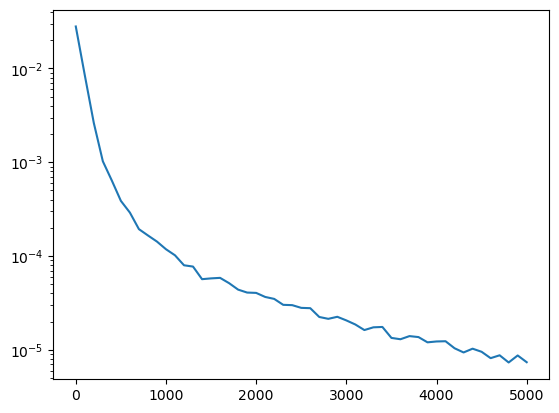

In [12]:
plt.plot(list(range(0, 5001,100)), train_loss_O)
plt.yscale("log")
plt.show()

In [13]:
torch.save(model_O.state_dict(), "./model_O_hamil_md.param")

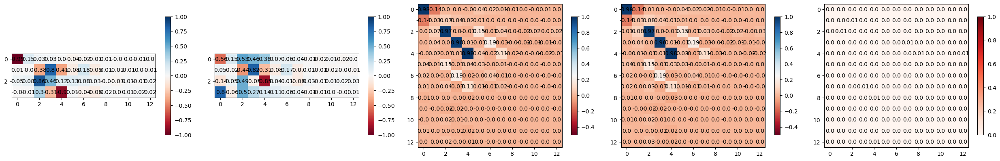

0: 2.621948e-01


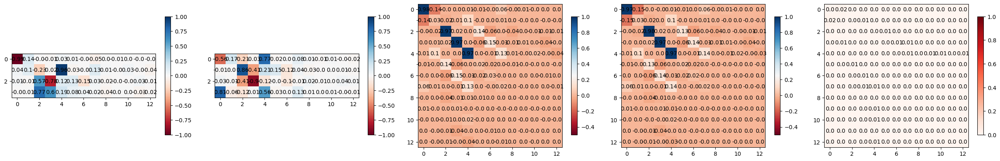

1: 3.271692e-01


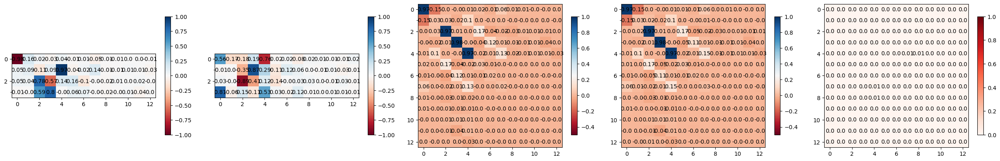

2: 2.042541e-01


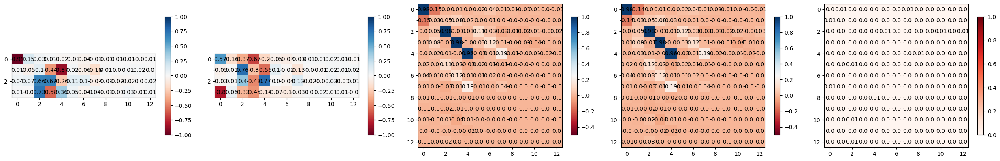

3: 2.175796e-01


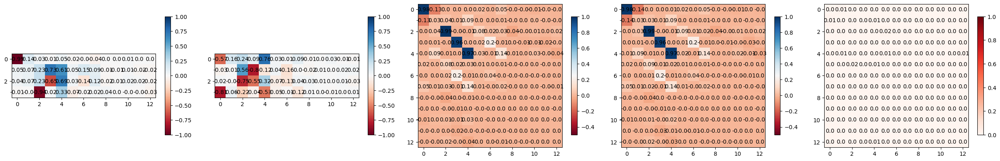

4: 2.745504e-01


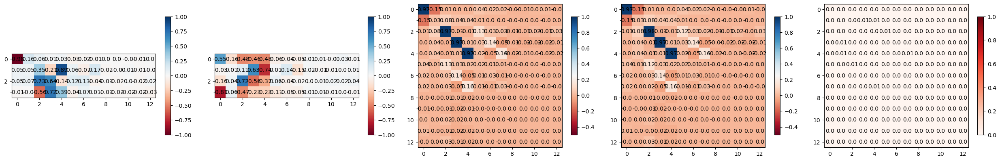

5: 2.144456e-01


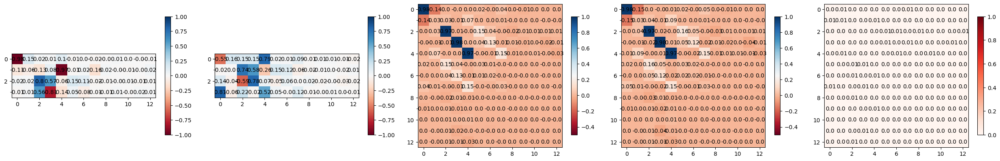

6: 3.844708e-01


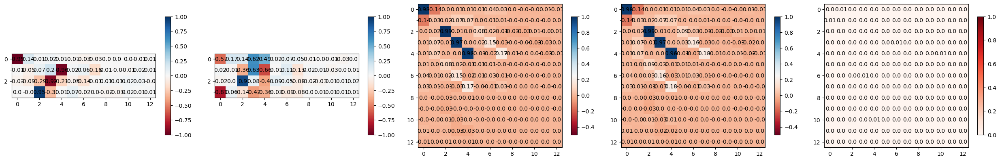

7: 2.159125e-01


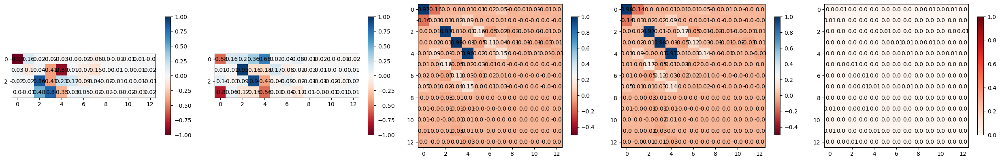

8: 3.601893e-01


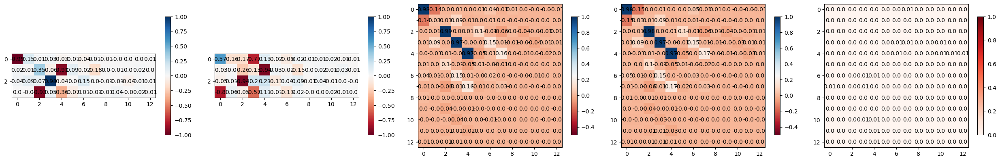

9: 2.422025e-01


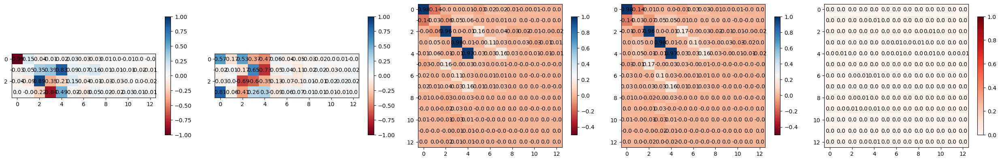

10: 2.798296e-01


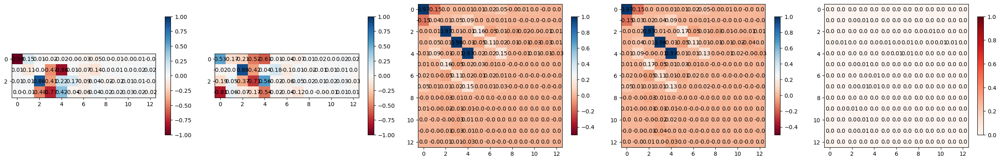

11: 2.960090e-01


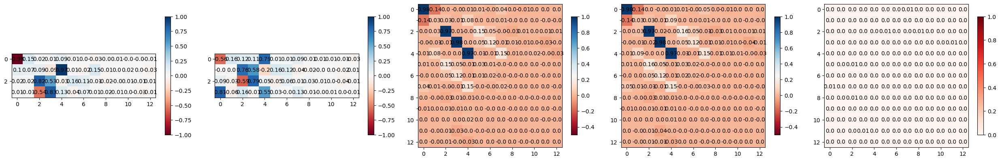

12: 2.491609e-01


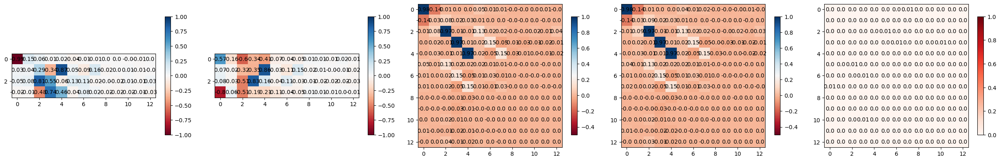

13: 1.684683e-01


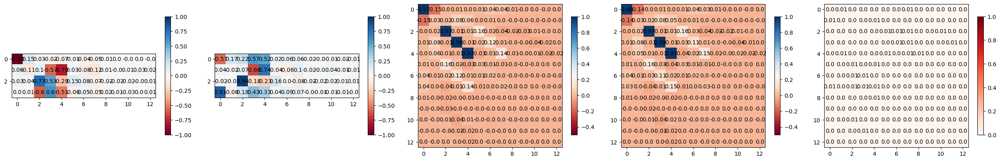

14: 2.919461e-01


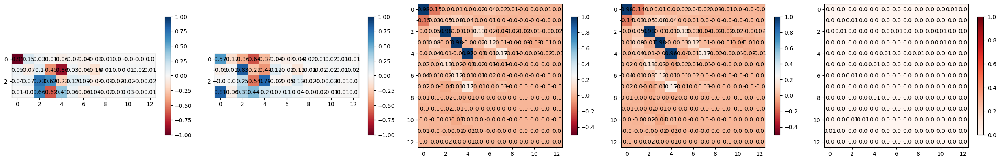

15: 2.728816e-01


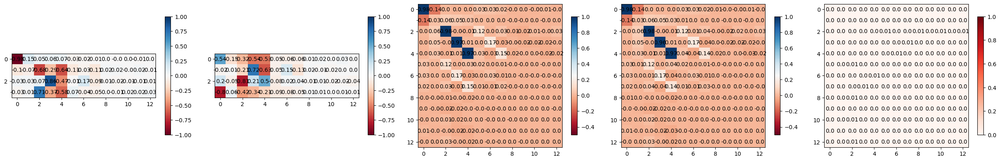

16: 2.405231e-01


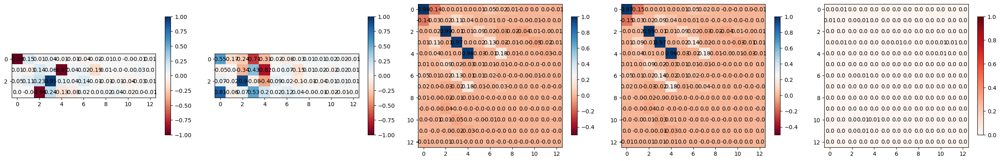

17: 2.835573e-01


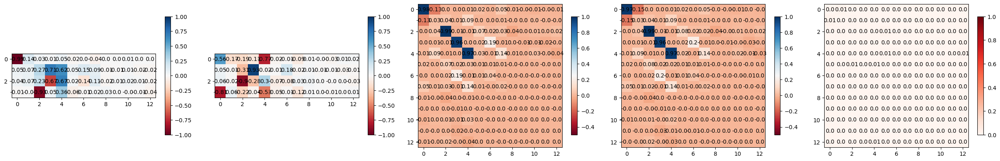

18: 2.593785e-01


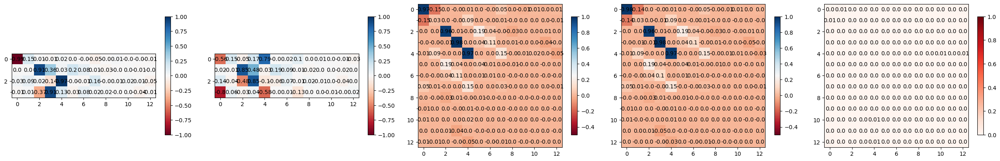

19: 2.141123e-01


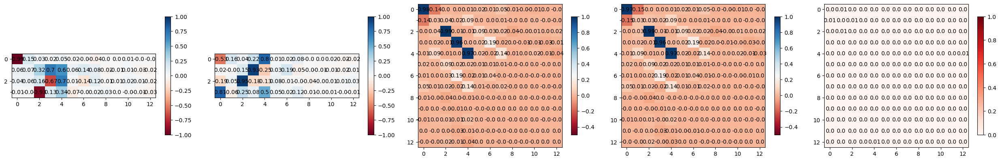

20: 1.913556e-01


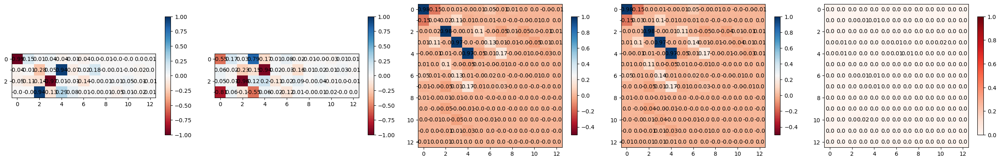

21: 3.085417e-01


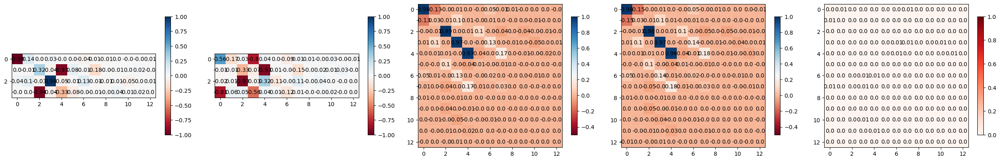

22: 2.628985e-01


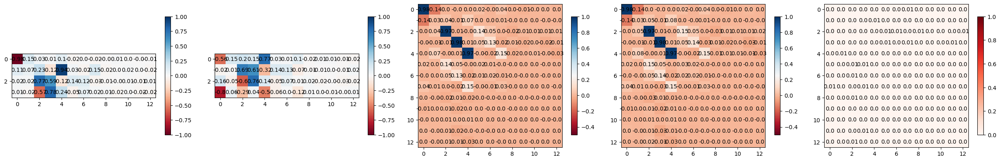

23: 2.733580e-01


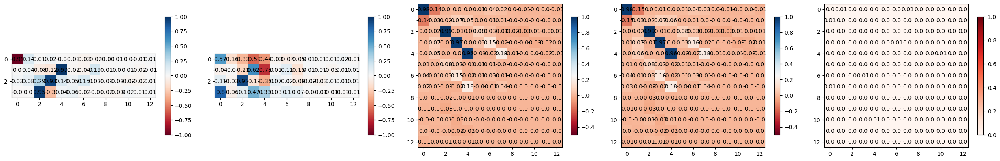

24: 1.978640e-01


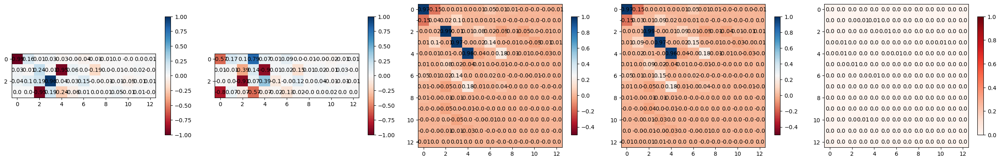

25: 2.609437e-01


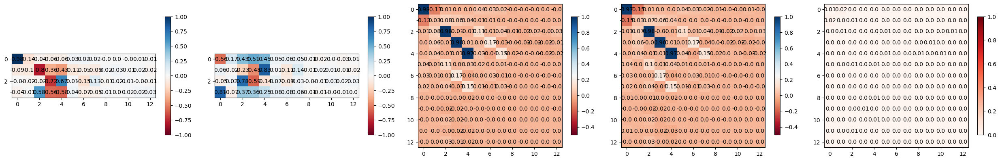

26: 2.897065e-01


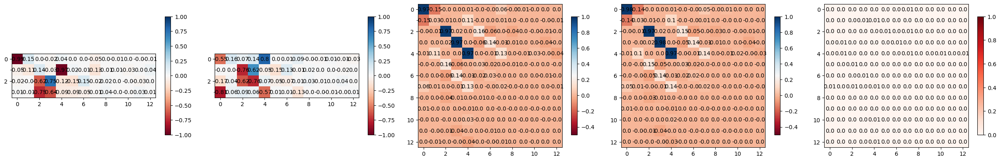

27: 3.359433e-01


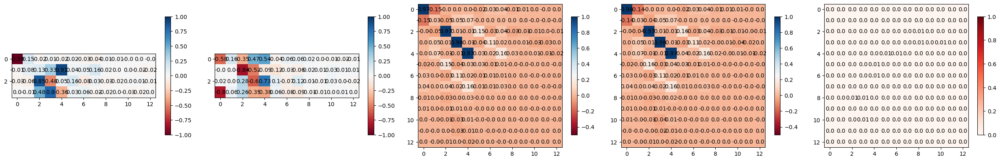

28: 2.550942e-01


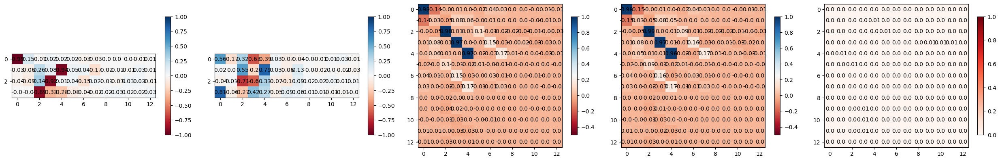

29: 2.502844e-01


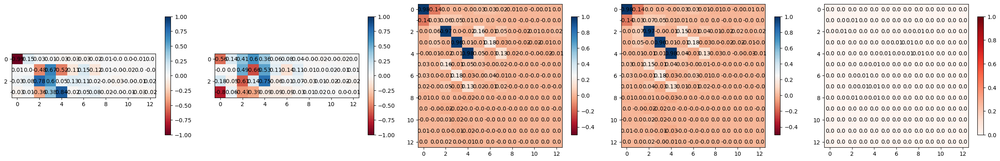

30: 2.947213e-01


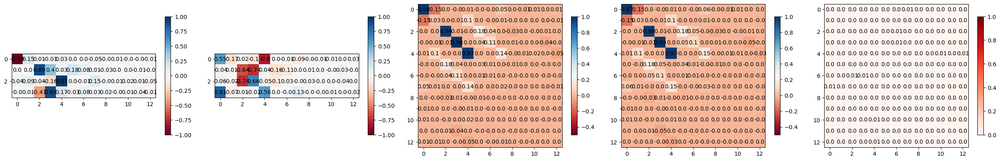

31: 2.164582e-01


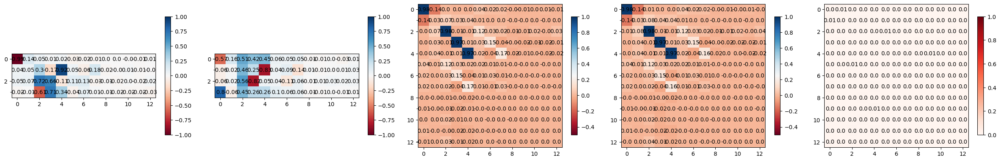

32: 2.110176e-01


In [15]:
prim_basis_spec = prim_basis_specs["O"]
prim_basis_size = o3.Irreps(prim_basis_spec).dim
batch_size = 1

for idx, pao_object in enumerate(test_data_O):
    pao_object["batch"] = t([0]*len(pao_object.pos))
    label = pao_object.y.reshape(batch_size, pao_basis_size, prim_basis_size)
    pred = aux_H_to_pao(model_O(pao_object), pao_basis_size)
    pred_projector = torch.bmm(torch.transpose(pred, dim0=1, dim1=2), pred).squeeze()
    label_projector = torch.bmm(torch.transpose(label, dim0=1, dim1=2), label).squeeze()
    fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(25.0, 4.0))
    ax0 = axs[0].imshow(pred.squeeze().detach(), cmap="RdBu",vmin=-1, vmax=1)
    ax1 = axs[1].imshow(label.squeeze(), cmap="RdBu",vmin=-1, vmax=1)
    ax2 = axs[2].imshow(pred_projector.detach(), cmap="RdBu",vmin=-0.5, vmax=1)
    ax3 = axs[3].imshow(label_projector.detach(), cmap="RdBu",vmin=-0.5, vmax=1)
    ax4 = axs[4].imshow((pred_projector-label_projector).abs().detach(), cmap="Reds",vmin=0, vmax=1)
    for (j,i),l in np.ndenumerate(pred.squeeze().detach()):
        axs[0].text(i,j,round(l,2),ha='center',va='center')
    for (j,i),l in np.ndenumerate(label.squeeze()):
        axs[1].text(i,j,round(l,2),ha='center',va='center')
    for (j,i),l in np.ndenumerate((pred_projector).detach()):
        axs[2].text(i,j,round(l,2),ha='center',va='center')
    for (j,i),l in np.ndenumerate(label_projector.detach()):
        axs[3].text(i,j,round(l,2),ha='center',va='center')
    for (j,i),l in np.ndenumerate((pred_projector-label_projector).abs().detach()):
        axs[4].text(i,j,round(l,2),ha='center',va='center')

    fig.colorbar(ax0, ax=axs[0], shrink=0.8)
    fig.colorbar(ax1, ax=axs[1], shrink=0.8)
    fig.colorbar(ax2, ax=axs[2], shrink=0.8)
    fig.colorbar(ax3, ax=axs[3], shrink=0.8)
    fig.colorbar(ax4, ax=axs[4], shrink=0.8)
    plt.tight_layout()
    plt.show()
    test_mae = (pred_projector-label_projector).abs().sum()
    print(f"{idx}: {test_mae:e}")

## PAO-Model Hydrogen

In [16]:
# Irreps Input
irreps_input = o3.Irreps("2x0e") # features: is_hydrogen, is_oxygen

# Irreps Spherical Harmonics
irreps_sh = o3.Irreps.spherical_harmonics(lmax=1)

# Primitive Basis specs

prim_basis_spec = o3.Irreps(prim_basis_specs["H"])
prim_basis_size = o3.Irreps(prim_basis_spec).dim

# Irreps Output
# ss ss'  sp
#    s's' s'p
#         pp
irreps_output = generate_irreps_output(prim_basis_spec)
print(irreps_output)

2x0e+1x1o+1x0e+1x1o+1x0e+1x2e


In [17]:
batch_size = 32
data_H = []
for pao_object in pao_objects_H:
    data_H += [
        Data(
            x=None, pos=pao_object.coords, y=pao_object.label, z=pao_object.atomkind
        )
    ]
train_data_H, test_data_H = train_test_split(data_H, test_size=0.2)
train_loader_H = DataLoader(
    train_data_H, batch_size=batch_size, shuffle=True
)

In [18]:
max_radius = 4.0
num_neighbours = 5
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=UserWarning)
    model_H = PAO_model(
        max_radius=max_radius,
        num_layers=32,
        num_neighbours=num_neighbours,
        pao_basis_size=pao_basis_size,
        prim_basis_spec=prim_basis_spec,
        prim_basis_size=prim_basis_size, 
        irreps_input=irreps_input,
        irreps_sh=irreps_sh,
        irreps_output=irreps_output
    )

In [19]:
# Train the model.
optim = torch.optim.Adam(model_H.parameters(), lr=1e-3)
train_loss_H = []
for step in range(5001):
    data = next(iter(train_loader_H))
    optim.zero_grad()
    temp_loss = 0
    label = data.y.reshape((batch_size, pao_basis_size, prim_basis_size))
    pred = aux_H_to_pao(model_H(data), pao_basis_size)
    loss = loss_function_ortho_projector_batch(pred, label)
    loss.backward()
    if step % 100 == 0:
        train_loss_H.append(loss.detach())
        print(f"training {step:5d} | loss {loss.detach():.8e}")
    optim.step()

training     0 | loss 7.14800805e-02
training   100 | loss 1.87281873e-02
training   200 | loss 6.66674552e-03
training   300 | loss 3.31421802e-03
training   400 | loss 1.57816487e-03
training   500 | loss 1.48940948e-03
training   600 | loss 1.36265007e-03
training   700 | loss 1.04306894e-03
training   800 | loss 8.58749321e-04
training   900 | loss 7.04131264e-04
training  1000 | loss 6.48961170e-04
training  1100 | loss 5.80716704e-04
training  1200 | loss 4.66194935e-04
training  1300 | loss 4.45224316e-04
training  1400 | loss 3.92319722e-04
training  1500 | loss 3.65543558e-04
training  1600 | loss 3.68097535e-04
training  1700 | loss 3.09814466e-04
training  1800 | loss 2.72944802e-04
training  1900 | loss 3.63038678e-04
training  2000 | loss 2.73148151e-04
training  2100 | loss 2.78538733e-04
training  2200 | loss 2.86529335e-04
training  2300 | loss 2.87045958e-04
training  2400 | loss 2.47605698e-04
training  2500 | loss 2.97895283e-04
training  2600 | loss 2.07654157e-04
t

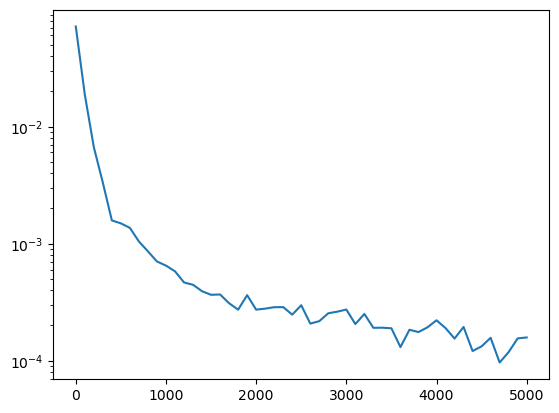

In [20]:
plt.plot(list(range(0, 5001,100)), train_loss_H)
plt.yscale("log")
plt.show()

In [21]:
torch.save(model_H.state_dict(), "./model_H_hamil_md.param")

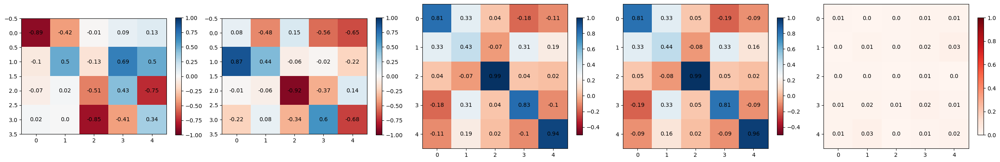

0: 1.046845e-02


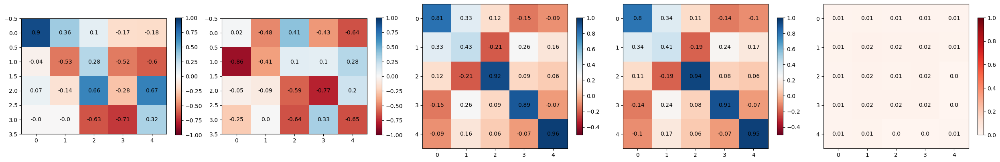

1: 1.163343e-02


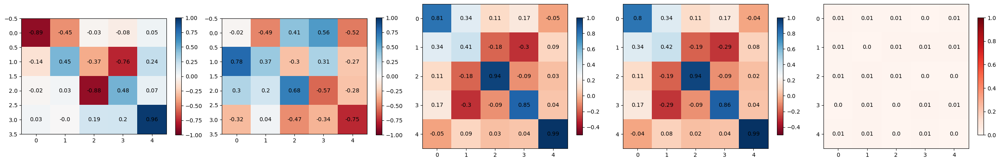

2: 6.049149e-03


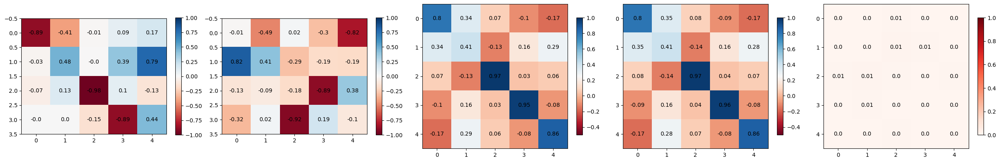

3: 3.493424e-03


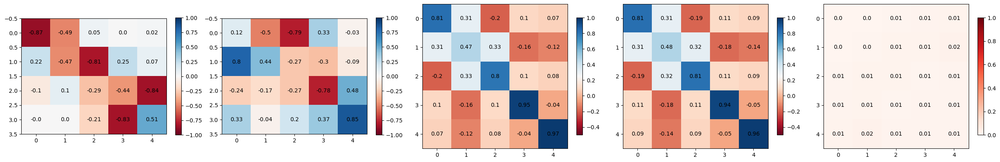

4: 9.584947e-03


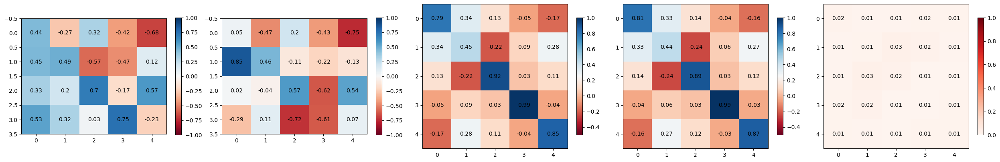

5: 1.344308e-02


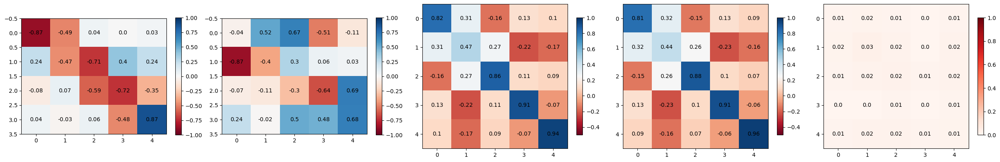

6: 1.210761e-02


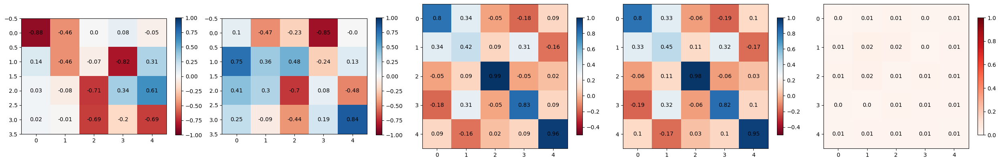

7: 9.461586e-03


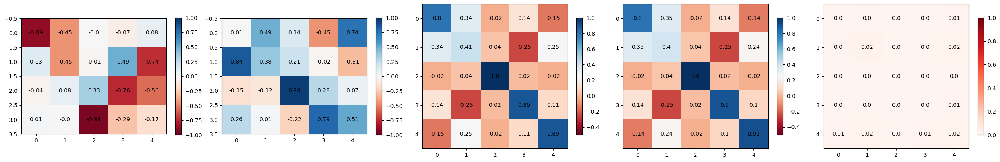

8: 5.462054e-03


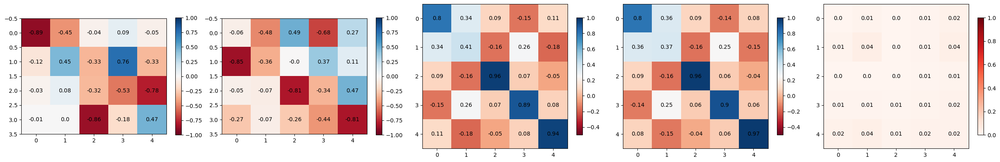

9: 1.423724e-02


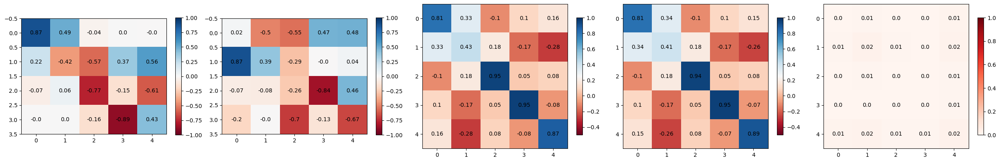

10: 6.908414e-03


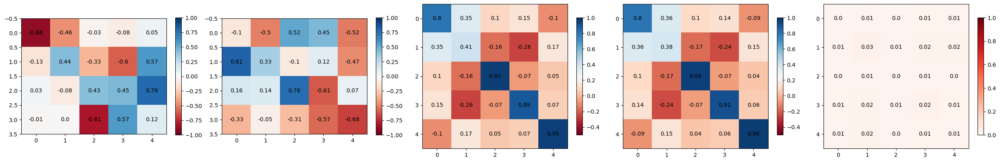

11: 1.057861e-02


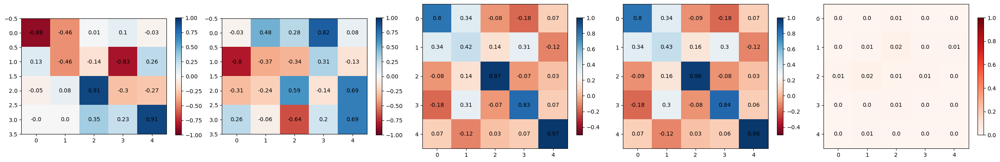

12: 7.110038e-03


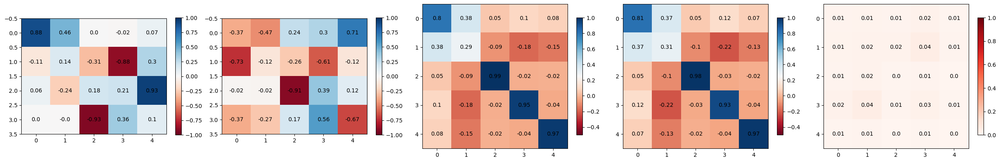

13: 1.393581e-02


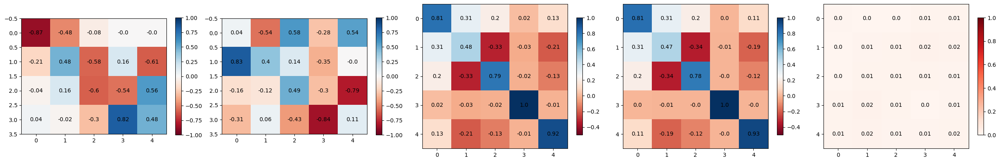

14: 1.095766e-02


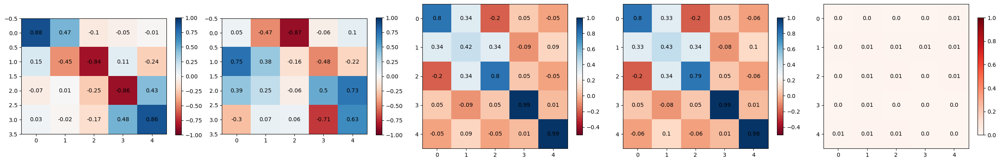

15: 5.305333e-03


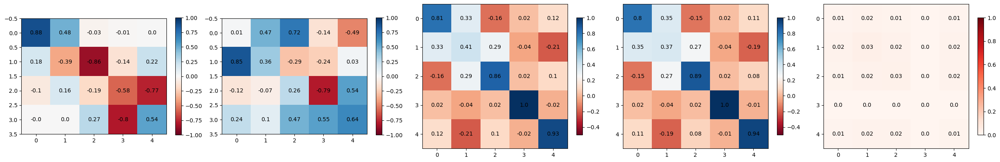

16: 1.177189e-02


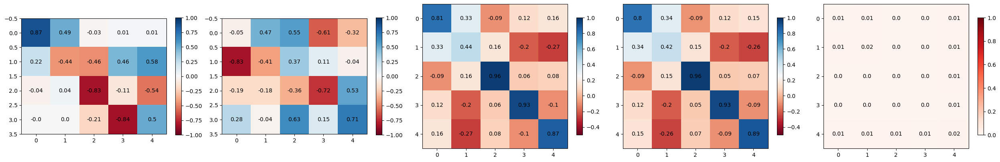

17: 6.425011e-03


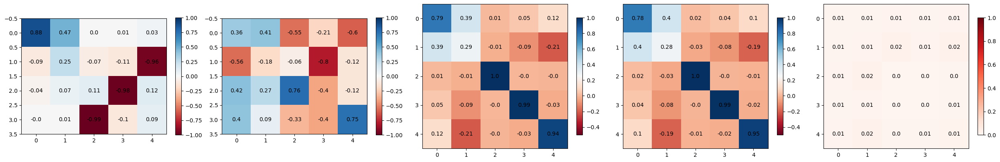

18: 9.307536e-03


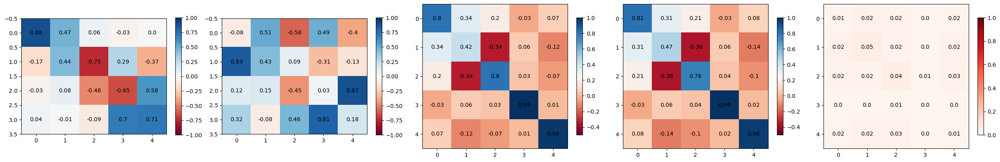

19: 1.495513e-02


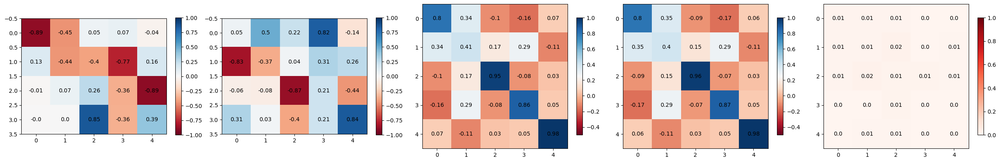

20: 7.461819e-03


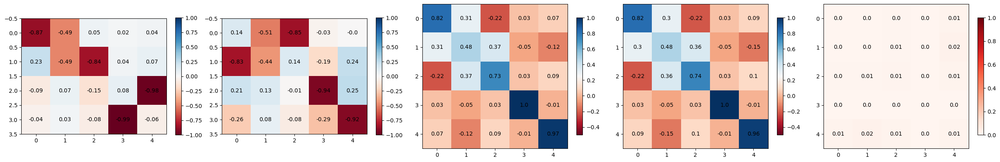

21: 6.454986e-03


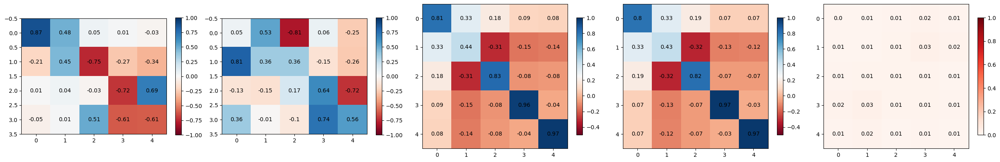

22: 1.192131e-02


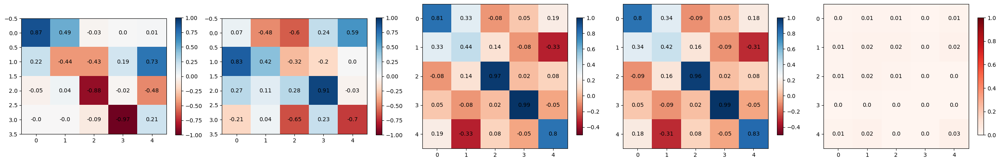

23: 9.523417e-03


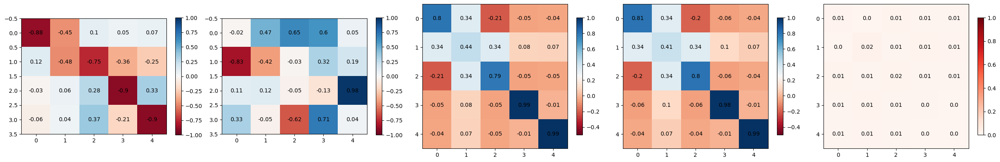

24: 7.497068e-03


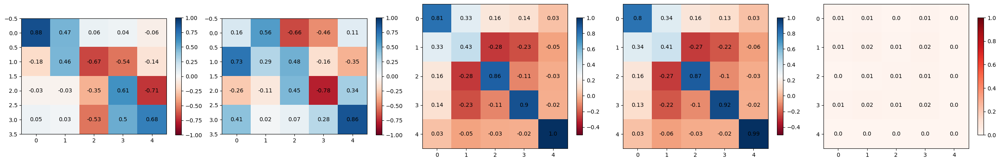

25: 7.022389e-03


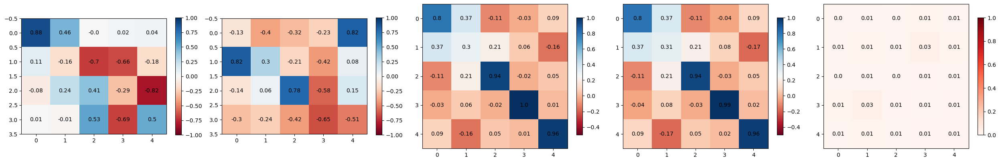

26: 9.771825e-03


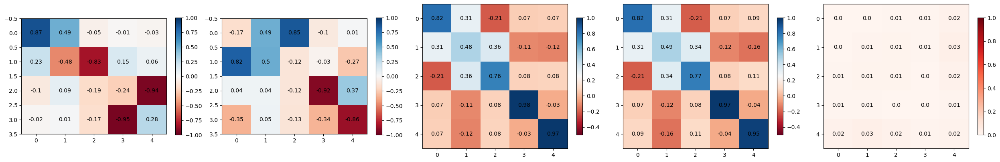

27: 1.164154e-02


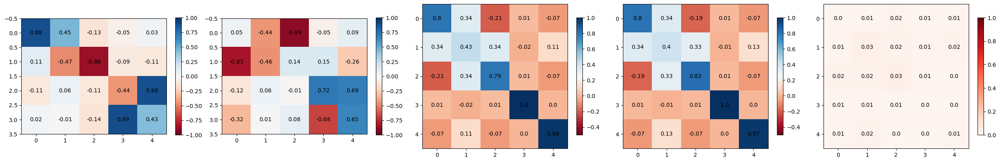

28: 9.850604e-03


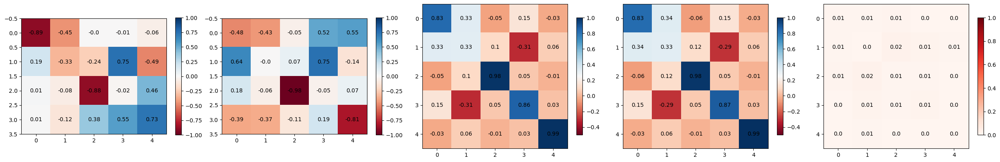

29: 7.128347e-03


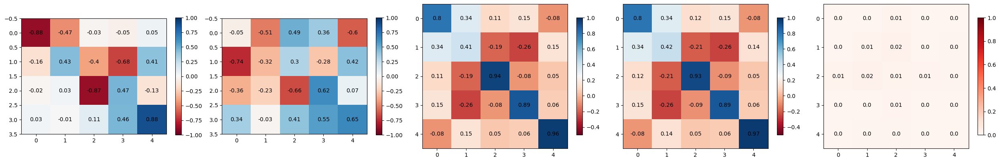

30: 6.192802e-03


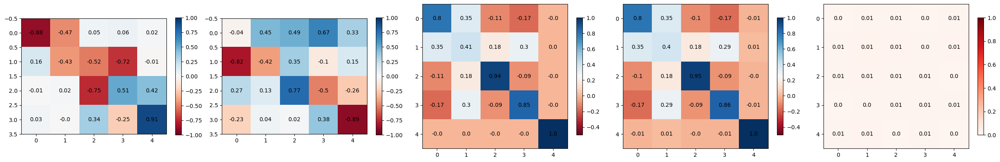

31: 6.052402e-03


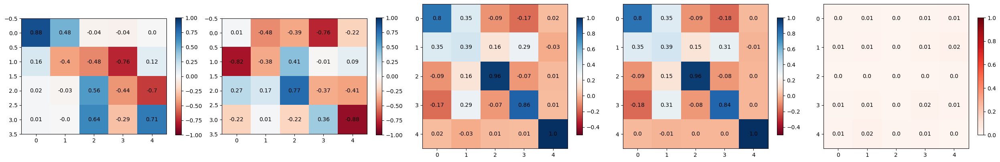

32: 7.707770e-03


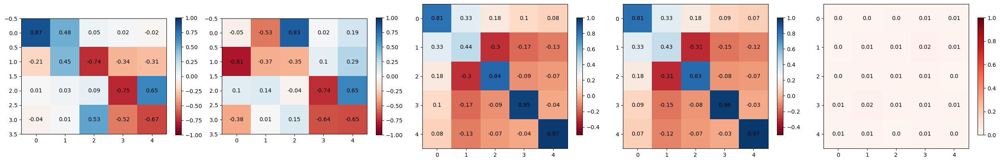

33: 8.992569e-03


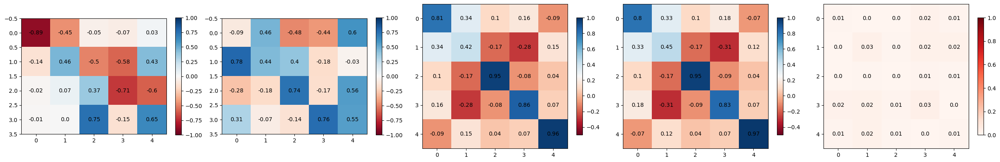

34: 1.205230e-02


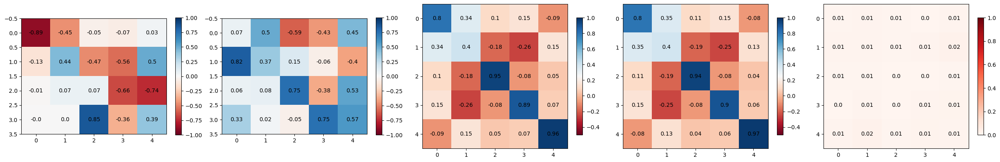

35: 8.115938e-03


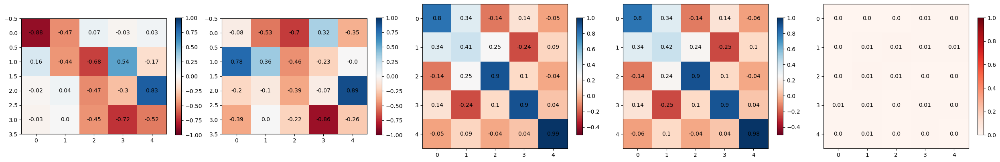

36: 4.525233e-03


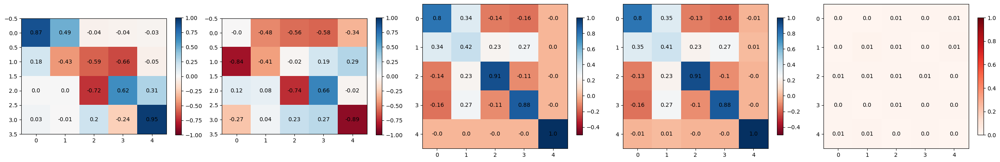

37: 4.809890e-03


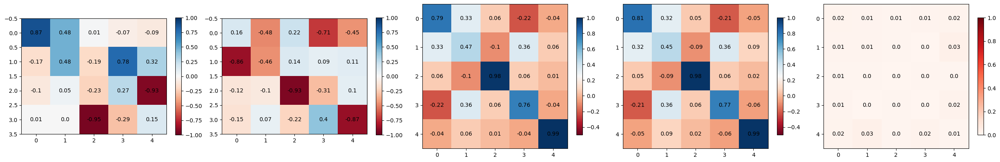

38: 9.664690e-03


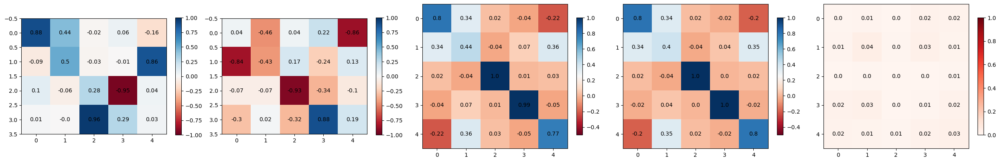

39: 1.337790e-02


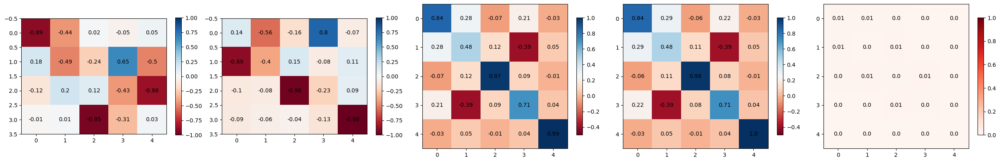

40: 4.516586e-03


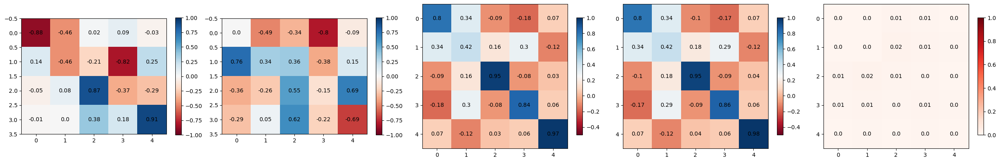

41: 5.880241e-03


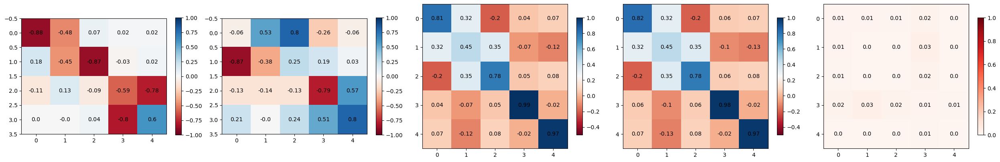

42: 8.090750e-03


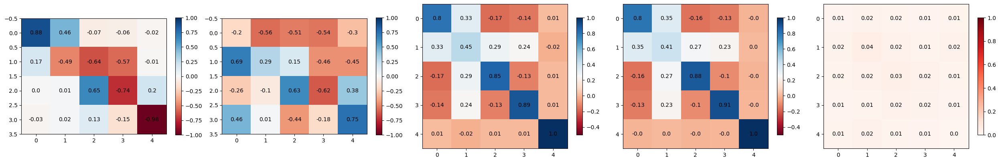

43: 1.666440e-02


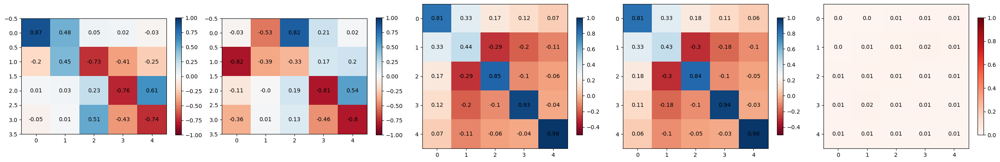

44: 8.322997e-03


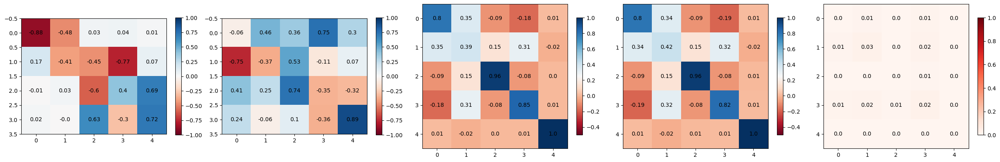

45: 6.278593e-03


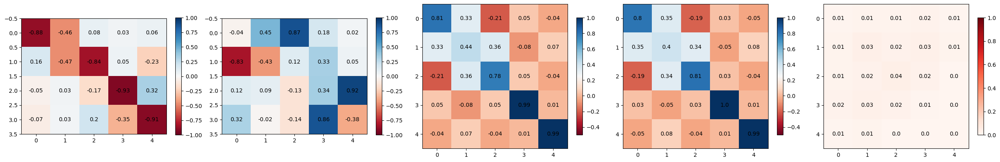

46: 1.461198e-02


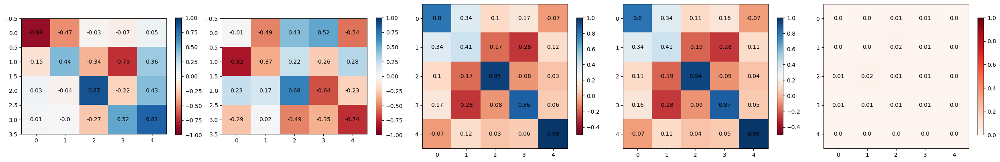

47: 5.781861e-03


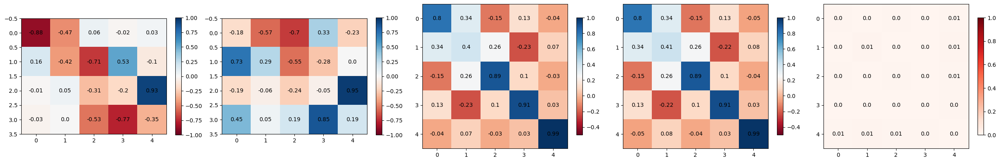

48: 4.126628e-03


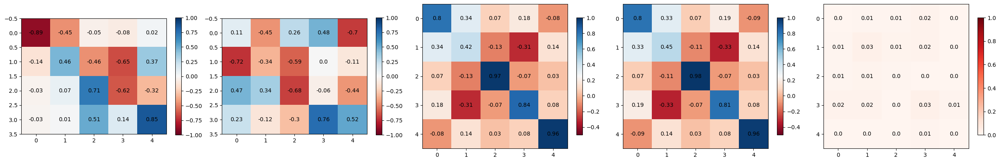

49: 8.804057e-03


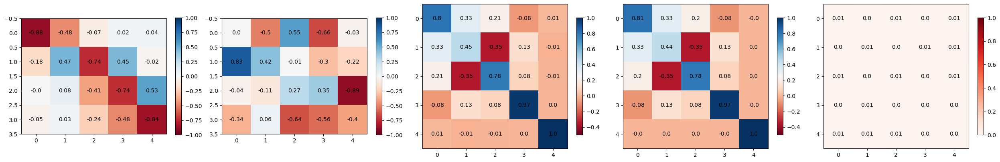

50: 5.162652e-03


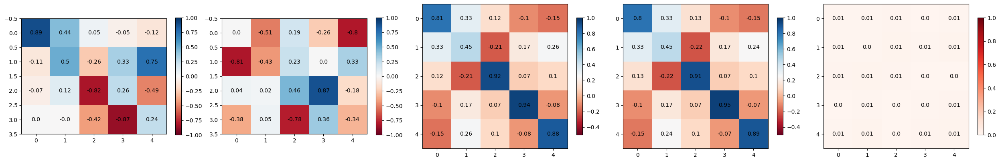

51: 7.053255e-03


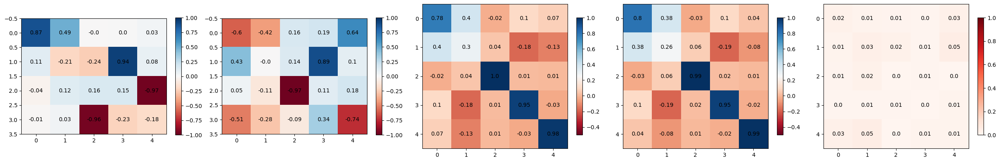

52: 1.528652e-02


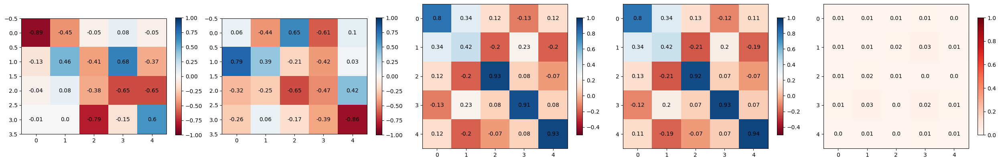

53: 9.968031e-03


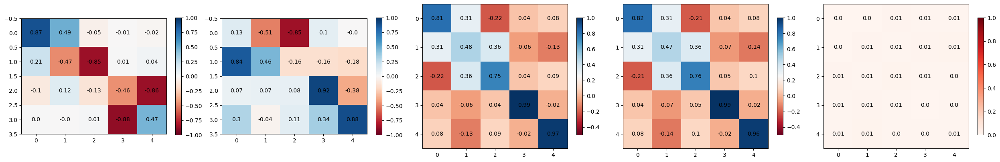

54: 6.581243e-03


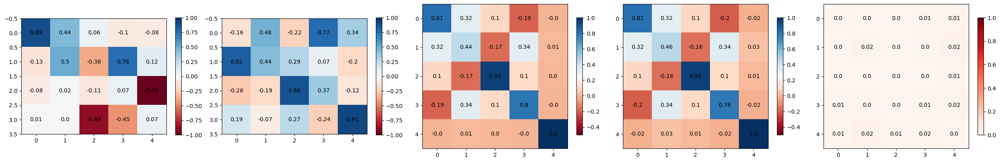

55: 8.208933e-03


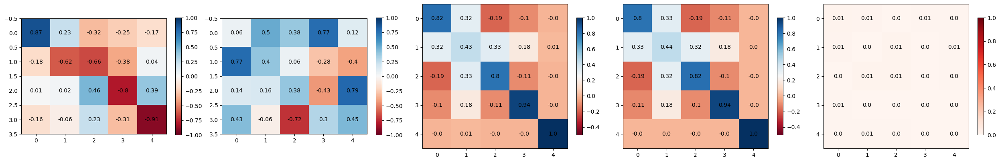

56: 5.576489e-03


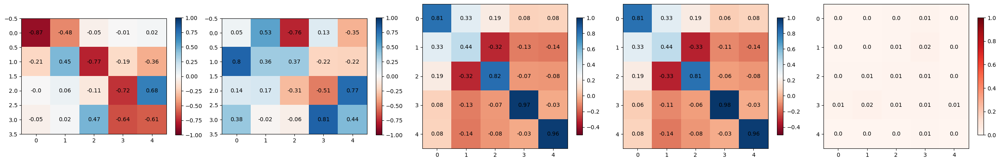

57: 6.084851e-03


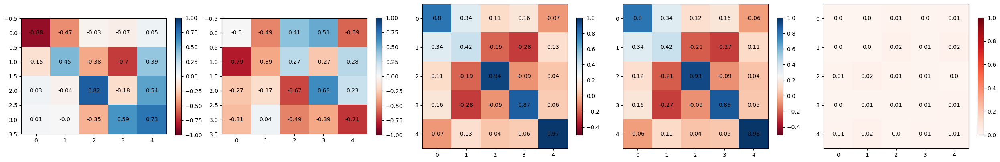

58: 8.847472e-03


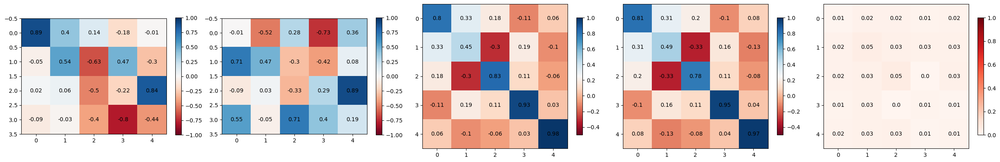

59: 2.045289e-02


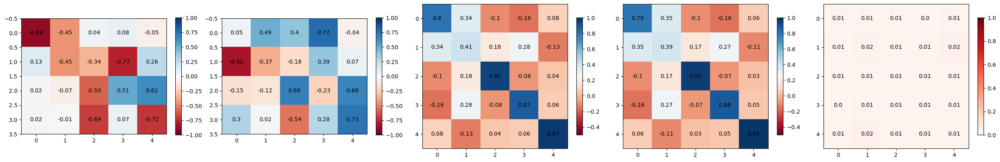

60: 1.075003e-02


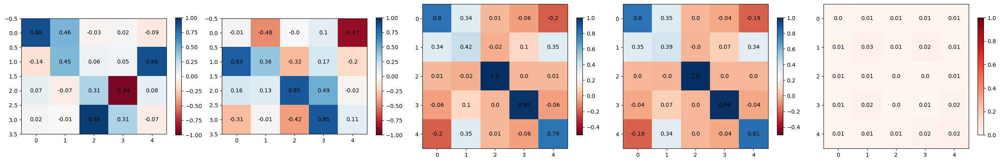

61: 1.157108e-02


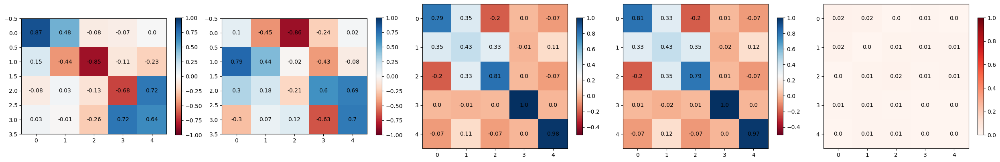

62: 7.748344e-03


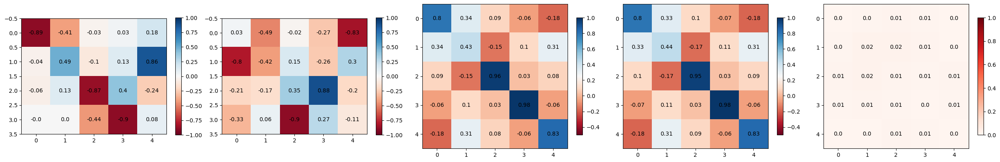

63: 7.124794e-03


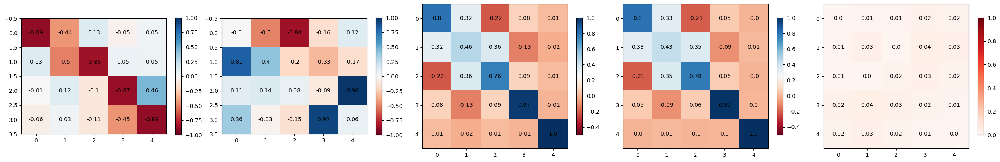

64: 1.728088e-02


In [26]:
prim_basis_spec = prim_basis_specs["H"]
prim_basis_size = o3.Irreps(prim_basis_spec).dim
batch_size = 1

for idx, pao_object in enumerate(test_data_H):
    pao_object["batch"] = t([0]*len(pao_object.pos))
    label = pao_object.y.reshape(batch_size, pao_basis_size, prim_basis_size)
    pred = aux_H_to_pao(model_H(pao_object), pao_basis_size)
    pred_projector = torch.bmm(torch.transpose(pred, dim0=1, dim1=2), pred).squeeze()
    label_projector = torch.bmm(torch.transpose(label, dim0=1, dim1=2), label).squeeze()
    fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(25.0, 4.0))
    ax0 = axs[0].imshow(pred.squeeze().detach(), cmap="RdBu",vmin=-1, vmax=1)
    ax1 = axs[1].imshow(label.squeeze(), cmap="RdBu",vmin=-1, vmax=1)
    ax2 = axs[2].imshow(pred_projector.detach(), cmap="RdBu",vmin=-0.5, vmax=1)
    ax3 = axs[3].imshow(label_projector.detach(), cmap="RdBu",vmin=-0.5, vmax=1)
    ax4 = axs[4].imshow((pred_projector-label_projector).abs().detach(), cmap="Reds",vmin=0, vmax=1)
    for (j,i),l in np.ndenumerate(pred.squeeze().detach()):
        axs[0].text(i,j,round(l,2),ha='center',va='center')
    for (j,i),l in np.ndenumerate(label.squeeze()):
        axs[1].text(i,j,round(l,2),ha='center',va='center')
    for (j,i),l in np.ndenumerate(pred_projector.detach()):
        axs[2].text(i,j,round(l,2),ha='center',va='center')
    for (j,i),l in np.ndenumerate(label_projector.detach()):
        axs[3].text(i,j,round(l,2),ha='center',va='center')
    for (j,i),l in np.ndenumerate((pred_projector-label_projector).abs().detach()):
        axs[4].text(i,j,round(l,2),ha='center',va='center')
    fig.colorbar(ax0, ax=axs[0], shrink=0.8)
    fig.colorbar(ax1, ax=axs[1], shrink=0.8)
    fig.colorbar(ax2, ax=axs[2], shrink=0.8)
    fig.colorbar(ax3, ax=axs[3], shrink=0.8)
    fig.colorbar(ax4, ax=axs[4], shrink=0.8)
    plt.tight_layout()
    plt.show()
    test_mae = (pred_projector-label_projector).abs().mean()
    print(f"{idx}: {test_mae:e}")

In [28]:
for path in sorted(Path().glob("2H2O_MD/frame_*/2H2O_pao44-1_0.pao")):
    pao_objects = generate_pao_object_from_file(path)
    pao_objects_O = [pao_object for pao_object in pao_objects if pao_object.kind.atomic_number==8]
    pao_objects_H = [pao_object for pao_object in pao_objects if pao_object.kind.atomic_number==1]
    kinds, atom2kind, sample_coords, sample_xblocks = parse_pao_file_torch(path)
    pred_xblocks = sample_xblocks.copy()
    data_O = []
    for pao_object in pao_objects_O:
        data_O += [
            Data(
                x=None, pos=pao_object.coords, y=pao_object.label, z=pao_object.atomkind, batch=t([0]*len(pao_object.coords))
            )
        ]
    data_H = []
    for pao_object in pao_objects_H:
        data_H += [
            Data(
                x=None, pos=pao_object.coords, y=pao_object.label, z=pao_object.atomkind, batch=t([0]*len(pao_object.coords))
            )
        ]
    
    prim_basis_size = o3.Irreps(prim_basis_specs["O"]).dim    
    pred_xblocks[0] = aux_H_to_pao(model_O(data_O[0]), pao_basis_size).squeeze()
    pred_xblocks[3] = aux_H_to_pao(model_O(data_O[1]), pao_basis_size).squeeze()
    
    prim_basis_size = o3.Irreps(prim_basis_specs["H"]).dim
    pred_xblocks[1] = aux_H_to_pao(model_H(data_H[0]), pao_basis_size).squeeze()
    pred_xblocks[2] = aux_H_to_pao(model_H(data_H[1]), pao_basis_size).squeeze()
    pred_xblocks[4] = aux_H_to_pao(model_H(data_H[2]), pao_basis_size).squeeze()
    pred_xblocks[5] = aux_H_to_pao(model_H(data_H[3]), pao_basis_size).squeeze()
    
    write_pao_file(path.parent / "2H2O_pao44_eval.pao", kinds, atom2kind, sample_coords, pred_xblocks)
    ! cd {path.parent};source /data/vdella/software/cp2k/tools/toolchain/install/setup; OMP_NUM_THREADS=8 /data/vdella/software/cp2k/exe/local/cp2k.sdbg 2H2O_pao44_eval.inp > 2H2O_pao44_eval.out
    test_energy = read_cp2k_energy(path.parent / "2H2O_pao44_eval.out")
    ref_energy = read_cp2k_energy(path.parent / "2H2O_pao44.out")
    abs_diff_energy = test_energy - ref_energy
    rel_diff_energy = abs_diff_energy / ref_energy
    print(f"{path}: Absolute Energy Diff: {abs_diff_energy:e} Relative Energy Diff: {rel_diff_energy:e}")
    ! grep "SCF run converged in" {path.parent}/2H2O_pao44_eval.out

2H2O_MD/frame_0000/2H2O_pao44-1_0.pao: Absolute Energy Diff: 1.714155e-03 Relative Energy Diff: -4.975787e-05
 SCF run converged in     9 steps.
2H2O_MD/frame_0025/2H2O_pao44-1_0.pao: Absolute Energy Diff: 1.201689e-03 Relative Energy Diff: -3.488320e-05
 SCF run converged in     9 steps.
2H2O_MD/frame_0050/2H2O_pao44-1_0.pao: Absolute Energy Diff: 1.267926e-03 Relative Energy Diff: -3.680625e-05
 SCF run converged in     9 steps.
2H2O_MD/frame_0075/2H2O_pao44-1_0.pao: Absolute Energy Diff: 1.288094e-03 Relative Energy Diff: -3.739273e-05
 SCF run converged in     9 steps.
2H2O_MD/frame_0100/2H2O_pao44-1_0.pao: Absolute Energy Diff: 1.990203e-03 Relative Energy Diff: -5.777531e-05
 SCF run converged in     9 steps.
2H2O_MD/frame_0125/2H2O_pao44-1_0.pao: Absolute Energy Diff: 1.850610e-03 Relative Energy Diff: -5.372372e-05
 SCF run converged in     9 steps.
2H2O_MD/frame_0150/2H2O_pao44-1_0.pao: Absolute Energy Diff: 2.767916e-03 Relative Energy Diff: -8.035320e-05
 SCF run converged i